### Notebook for of identified fetal stem cells populations with LGR5- stem cells from Haber, 2017 dataset

- **Developed by:** Anna Maguza
- **Place:** Wuerzburg Institute for System Immunology
- **Created date:** 19th August 2024
- **Last modified date:** 9th September 2024

#### Import required modules

In [1]:
import gdown
import torch
import anndata
import warnings
import numpy as np
import scanpy as sc
import pandas as pd
import scarches as sca
import matplotlib.pyplot as plt

/home/amaguza/miniforge3/envs/expimap/lib/python3.10/site-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
/home/amaguza/miniforge3/envs/expimap/lib/python3.10/site-packages/scvi/_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (
 captum (see https://github.com/pytorch/captum).


In [2]:
def X_is_raw(adata):
    return np.array_equal(adata.X.sum(axis=0).astype(int), adata.X.sum(axis=0))

#### Set up working environment

In [3]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 180, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.10.5.post1
scanpy      1.9.8
-----
PIL                         10.2.0
absl                        NA
aiohttp                     3.9.3
aiosignal                   1.3.1
annotated_types             0.6.0
anyio                       NA
array_api_compat            1.4.1
arrow                       1.3.0
asttokens                   NA
async_timeout               4.0.3
attr                        23.2.0
attrs                       23.2.0
babel                       2.14.0
backoff                     2.2.1
bs4                         4.12.3
certifi                     2024.02.02
cffi                        1.16.0
charset_normalizer          3.3.2
chex                        0.1.7
click                       8.1.7
comm                        0.2.1
contextlib2                 NA
croniter                    NA
cycler                      0.12.1
cython_runtime              NA
dateutil                    2.9.0
debugpy                     1.8.1
decorator                   5.1.1

In [4]:
warnings.simplefilter(action = 'ignore')
%config InlineBackend.print_figure_kwargs = {'facecolor' : "w"}
%config InlineBackend.figure_format = 'retina'
torch.set_float32_matmul_precision('medium')

In [5]:
torch.cuda.is_available()

True

#### Read in data

In [6]:
human_adata = sc.read_h5ad("data/Fetal_stem_cells_leiden.h5ad")

In [7]:
mouse_adata = sc.read_h5ad("data/Haber_2017_Smartseq_stem_cells_remapped.h5ad")

#### Create common set of genes

In [8]:
orthologues = pd.read_csv("data/saturn_results/macrogenes_derived_human_mouse_orthologues_10K.csv")

In [9]:
len(set(orthologues['Top Human Gene']).intersection(set(human_adata.var.index)))

6798

In [10]:
len(set(orthologues['Top Mouse Gene']).intersection(set(mouse_adata.var.index)))

6619

In [11]:
human_adata = human_adata[:, orthologues['Top Human Gene']]

In [12]:
human_adata.var.index.duplicated().sum()

3202

In [13]:
human_adata = human_adata[:, ~human_adata.var_names.duplicated()].copy()

+ remove dublicated genes from mouse dataset, leave genes that are expressed in more cells

In [14]:
mouse_adata.var.index.duplicated().sum()

175

In [15]:
mouse_adata = mouse_adata[:, ~mouse_adata.var_names.isin(['nan'])].copy()

In [16]:
mouse_adata = mouse_adata[:, ~mouse_adata.var_names.duplicated()].copy()

In [17]:
mouse_adata = mouse_adata[:, orthologues['Top Mouse Gene']]

In [18]:
mouse_adata.var['gene_name'] = mouse_adata.var.index

In [19]:
orthologues['Top Mouse Gene'].duplicated().sum()

3381

In [20]:
orthologues = orthologues[~orthologues['Top Mouse Gene'].duplicated()]

In [21]:
mouse_adata.var = mouse_adata.var.merge(orthologues, left_on = 'gene_name', right_on = 'Top Mouse Gene', how = 'left')

In [22]:
mouse_adata.var.index = mouse_adata.var['Top Human Gene']

In [23]:
mouse_adata.var.index.duplicated().sum()

5078

In [24]:
mouse_adata = mouse_adata[:, ~mouse_adata.var_names.duplicated()].copy()

In [25]:
common_genes = set(human_adata.var.index).intersection(set(mouse_adata.var.index))

human_adata = human_adata[:, human_adata.var.index.isin(common_genes)].copy()
mouse_adata = mouse_adata[:, mouse_adata.var.index.isin(common_genes)].copy()

+ Prepare obs

In [26]:
mouse_adata.obs['Library_Preparation_Protocol'] = 'Smart-seq2'
mouse_adata.obs['Sample_ID'] = mouse_adata.obs['Sample']
mouse_adata.obs['Study_name'] = 'Haber, 2017'


+ Extract LGR5+ cells

In [27]:
mouse_adata = mouse_adata[mouse_adata.obs['cell_type']=='LGR5- stem cell']

In [28]:
mouse_adata

View of AnnData object with n_obs × n_vars = 68 × 4922
    obs: 'barcode', 'Gene_marker', 'Donor_ID', 'GFP_intensity', 'full_cell_description', 'cell_type', 'Sample', 'n_genes', 'n_counts', 'Library_Preparation_Protocol', 'Sample_ID', 'Study_name'
    var: 'ensemble_gene_id_version', 'ensemble_gene_id', 'start_position', 'end_position', 'chromosome_name', 'external_gene_name', 'n_counts', 'n_cells', 'gene_name', 'Macrogene', 'Top Human Gene', 'Top Mouse Gene'

### Read the Reactome annotations

In [29]:
reactome_link = 'database_data/reactome.gmt'

### Prepare reference data with ReactomeDB pathways

In [30]:
sca.utils.add_annotations(mouse_adata, reactome_link, min_genes = 12, clean = True)

- Remove all genes that are present in the data but absent in ReactomeDB

In [31]:
mouse_adata._inplace_subset_var(mouse_adata.varm['I'].sum(1)>0)

- Filter out all annotations (terms) with less than 12 genes.

In [32]:
select_terms = mouse_adata.varm['I'].sum(0)>12
mouse_adata.uns['terms'] = np.array(mouse_adata.uns['terms'])[select_terms].tolist()
mouse_adata.varm['I'] = mouse_adata.varm['I'][:, select_terms]

- Filter out genes not present in any of the terms after selection of HVGs.

In [33]:
mouse_adata._inplace_subset_var(mouse_adata.varm['I'].sum(1)>0)

### Create expiMap model and train it on reference dataset

In [34]:
mouse_adata.X = mouse_adata.X.astype(np.float32)

In [35]:
intr_cvae = sca.models.EXPIMAP(
    adata = mouse_adata,
    condition_key = 'cell_type',
    hidden_layer_sizes = [256, 256, 256],
    recon_loss = 'nb'
)


INITIALIZING NEW NETWORK..............
Encoder Architecture:
	Input Layer in, out and cond: 1521 256 1
	Hidden Layer 1 in/out: 256 256
	Hidden Layer 2 in/out: 256 256
	Mean/Var Layer in/out: 256 202
Decoder Architecture:
	Masked linear layer in, ext_m, ext, cond, out:  202 0 0 1 1521
	with hard mask.
Last Decoder layer: softmax


In [36]:
ALPHA = 0.7

In [37]:
early_stopping_kwargs = {
    "early_stopping_metric": "val_unweighted_loss", # val_unweighted_loss
    "threshold": 0,
    "patience": 50,
    "reduce_lr": True,
    "lr_patience": 13,
    "lr_factor": 0.1,
}
intr_cvae.train(
    n_epochs = 400,
    alpha_epoch_anneal = 100,
    alpha = ALPHA,
    alpha_kl = 0.5,
    weight_decay = 0.,
    early_stopping_kwargs = early_stopping_kwargs,
    use_early_stopping = True,
    monitor_only_val = False,
    seed = 1712,
    accelerator = "gpu",
    devices = [0]
)

Preparing (68, 1521)
Instantiating dataset
Init the group lasso proximal operator for the main terms.
 |███████████████████-| 98.2%  - epoch_loss: 5972.4428710938 - epoch_recon_loss: 5528.8999023438 - epoch_kl_loss: 887.0860595703 - val_loss: 5593.2114257812 - val_recon_loss: 5151.8867187500 - val_kl_loss: 882.649108886798
ADJUSTED LR
 |████████████████████| 100.0%  - epoch_loss: 5890.3613281250 - epoch_recon_loss: 5454.0795898438 - epoch_kl_loss: 872.5632324219 - val_loss: 5609.2309570312 - val_recon_loss: 5167.4902343750 - val_kl_loss: 883.4812011719
Saving best state of network...
Best State was in Epoch 378


In [38]:
MEAN = False

In [39]:
mouse_adata.obsm['X_cvae'] = intr_cvae.get_latent(mean = MEAN, only_active = True)

+ Extract meaningful latent directions

In [40]:
intr_cvae.latent_directions(adata=mouse_adata)

### Initlizling the model for query training

### MTRNR2L12+ASS1+_SC

+ Prepare query dataset

In [41]:
human_adata_copy = human_adata.copy()

In [42]:
human_adata = human_adata[human_adata.obs['cell_type']=='MTRNR2L12+ASS1+_SC'].copy()

In [43]:
human_adata = human_adata[:, mouse_adata.var_names]

+ Add terms to query dataset

In [44]:
human_adata.uns['terms'] = mouse_adata.uns['terms']

+ Train the model

In [45]:
q_intr_cvae = sca.models.EXPIMAP.load_query_data(human_adata, intr_cvae,
                                                 unfreeze_ext=True,
                                                 use_hsic=True,
                                                 hsic_one_vs_all=True
                                                )

AnnData object with n_obs × n_vars = 3979 × 1521
    obs: 'Sample_ID', 'Cell Type', 'Study_name', 'Donor_ID', 'Diagnosis', 'Age', 'Region code', 'Fraction', 'Sex', 'Library_Preparation_Protocol', 'batch', 'Age_group', 'Location', 'Cell States', 'Cell States GCA', 'Chem', 'Layer', 'Cell States Kong', 'dataset', 'n_genes_by_counts', 'total_counts', 'total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'pct_counts_ribo', 'Cell_ID', '_scvi_batch', '_scvi_labels', 'n_genes', 'n_counts', 'leiden', 'cluster', 'cell_type'
    var: 'feature_types-0-0-0', 'gene_name-1-0-0', 'gene_id-0-0', 'GENE-1-0', 'n_counts', 'n_cells'
    uns: 'Age_colors', 'Age_group_colors', 'Donor_ID_colors', 'Library_Preparation_Protocol_colors', 'Sex_colors', '_scvi_manager_uuid', '_scvi_uuid', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'rank_genes_groups', 'umap', 'terms'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    obsp: 'connectivities', 'distances'

INITI

In [46]:
q_intr_cvae.train(n_epochs = 400, 
                  alpha_epoch_anneal = 100, 
                  weight_decay = 0.,
                  alpha_kl = 0.1, 
                  seed = 1712, 
                  alpha_l1=0.96,
                  gamma_ext=0.7,
                  gamma_epoch_anneal=50, 
                  beta=3.,
                  use_early_stopping = True,
                  accelerator = "gpu",
                  devices = [0])

Preparing (3979, 1521)
Instantiating dataset
 |██████--------------| 32.8%  - val_loss: 754.4102630615 - val_recon_loss: 718.3215484619 - val_kl_loss: 360.88719177250
ADJUSTED LR
 |██████--------------| 34.5%  - val_loss: 762.3987579346 - val_recon_loss: 726.4072418213 - val_kl_loss: 359.9151535034
Stopping early: no improvement of more than 0 nats in 20 epochs
If the early stopping criterion is too strong, please instantiate it with different parameters in the train method.
Saving best state of network...
Best State was in Epoch 116


### Get latent representation of reference + query dataset

In [47]:
adata_joined = sc.AnnData.concatenate(mouse_adata, human_adata, batch_key = 'batch_join', uns_merge = 'same', index_unique = None)
adata_joined

AnnData object with n_obs × n_vars = 4047 × 1521
    obs: 'barcode', 'Gene_marker', 'Donor_ID', 'GFP_intensity', 'full_cell_description', 'cell_type', 'Sample', 'n_genes', 'n_counts', 'Library_Preparation_Protocol', 'Sample_ID', 'Study_name', 'Cell Type', 'Diagnosis', 'Age', 'Region code', 'Fraction', 'Sex', 'batch', 'Age_group', 'Location', 'Cell States', 'Cell States GCA', 'Chem', 'Layer', 'Cell States Kong', 'dataset', 'n_genes_by_counts', 'total_counts', 'total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'pct_counts_ribo', 'Cell_ID', '_scvi_batch', '_scvi_labels', 'leiden', 'cluster', 'batch_join'
    var: 'ensemble_gene_id_version-0', 'ensemble_gene_id-0', 'start_position-0', 'end_position-0', 'chromosome_name-0', 'external_gene_name-0', 'n_counts-0', 'n_cells-0', 'gene_name-0', 'Macrogene-0', 'Top Human Gene-0', 'Top Mouse Gene-0', 'n_counts-1', 'n_cells-1', 'feature_types-0-0-0-1', 'gene_name-1-0-0-1', 'gene_id-0-0-1', 'GENE-1-0-1'
    uns: 'terms'

+ Get latent representation for the concatenated dataset

In [48]:
adata_joined.obsm['X_cvae'] = q_intr_cvae.get_latent(adata_joined.X, 
                                                adata_joined.obs['cell_type'], 
                                                mean = MEAN, 
                                                only_active = True)

+ Visualize latent representation on the UMAP

In [49]:
if 'neighbors' in adata_joined.uns:
    del adata_joined.uns['neighbors']
sc.pp.neighbors(adata_joined, n_neighbors=20, metric='minkowski', use_rep='X_cvae')
sc.tl.umap(adata_joined, min_dist = 0.5, spread = 6, random_state = 1712)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:09)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)


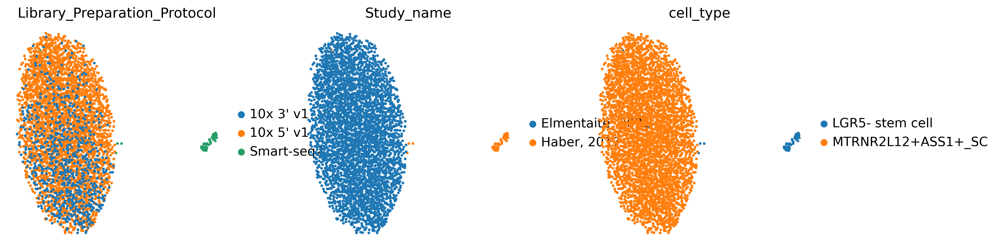

In [50]:
sc.pl.umap(adata_joined, color=['Library_Preparation_Protocol', 'Study_name', 'cell_type'], frameon=False)

+ Extract meaningful latent directions

In [51]:
q_intr_cvae.latent_directions(adata=adata_joined)

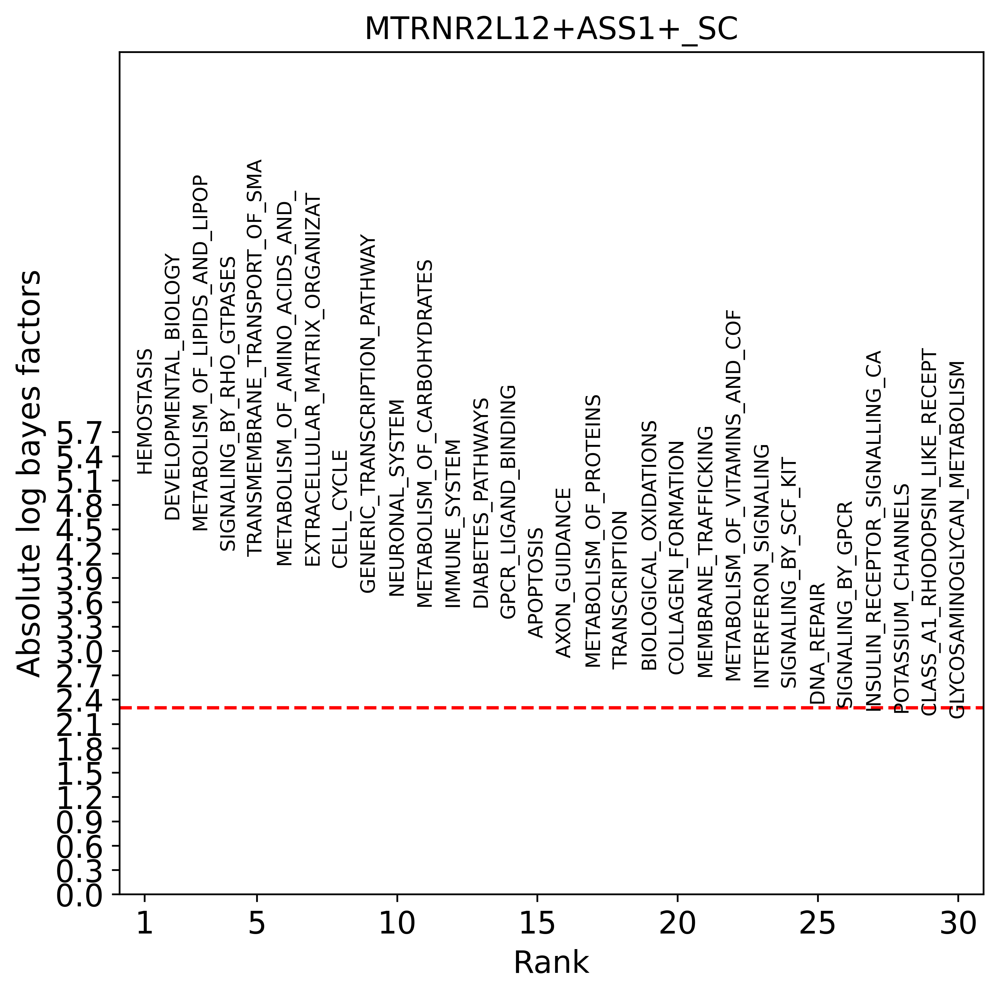

In [52]:
sc.set_figure_params(dpi=300, figsize=(7, 7))
q_intr_cvae.latent_enrich(groups = 'cell_type', comparison = 'LGR5- stem cell', adata = adata_joined, use_directions = True)
fig = sca.plotting.plot_abs_bfs(adata_joined, yt_step = 0.3, scale_y = 2, fontsize = 9)

+ Extract gene programs and absolute log bayes factors in the dataframe 

In [53]:
scores = adata_joined.uns['bf_scores']
terms = adata_joined.uns['terms']

all_programs = []

for key in scores.keys():
    bfs = np.abs(scores[key]['bf'])
    for bf, term in zip(bfs, terms):
        all_programs.append({
            'Comparison': key,
            'Gene Program': term,
            'Absolute Log Bayes Factor': bf
        })

df_gene_programs = pd.DataFrame(all_programs)
df_gene_programs = df_gene_programs.sort_values('Absolute Log Bayes Factor', ascending=False)

In [54]:
print(df_gene_programs.head())

             Comparison                    Gene Program  \
166  MTRNR2L12+ASS1+_SC                      HEMOSTASIS   
8    MTRNR2L12+ASS1+_SC           DEVELOPMENTAL_BIOLOGY   
136  MTRNR2L12+ASS1+_SC  METABOLISM_OF_LIPIDS_AND_LIPOP   
5    MTRNR2L12+ASS1+_SC        SIGNALING_BY_RHO_GTPASES   
78   MTRNR2L12+ASS1+_SC  TRANSMEMBRANE_TRANSPORT_OF_SMA   

     Absolute Log Bayes Factor  
166                   5.190820  
8                     4.625262  
136                   4.491110  
5                     4.239941  
78                    4.163766  


In [55]:
df_gene_programs.to_csv('data/expimap_results/LGR5low_vs_MTRNR2L12+ASS1+_SC.csv', index=False)

+ Create Venn diagram

In [92]:
df_gene_programs = pd.read_csv('data/expimap_results/LGR5low_vs_MTRNR2L12+ASS1+_SC.csv')

In [93]:
df_filtered = df_gene_programs[df_gene_programs['Absolute Log Bayes Factor'] != 0]

In [94]:
removed_count = len(df_gene_programs) - len(df_filtered)
print(f"Number of gene programs removed (Absolute Log Bayes Factor = 0): {removed_count}")

Number of gene programs removed (Absolute Log Bayes Factor = 0): 18


In [95]:
shared_programs = set(df_filtered[df_filtered['Absolute Log Bayes Factor'] < 2.4]['Gene Program'])
distinct_programs = set(df_filtered[df_filtered['Absolute Log Bayes Factor'] >= 2.4]['Gene Program'])

Text(0.5, 1.0, 'LGR5- Stem Cells and MTRNR2L12+ASS1+_SC Gene Programs')

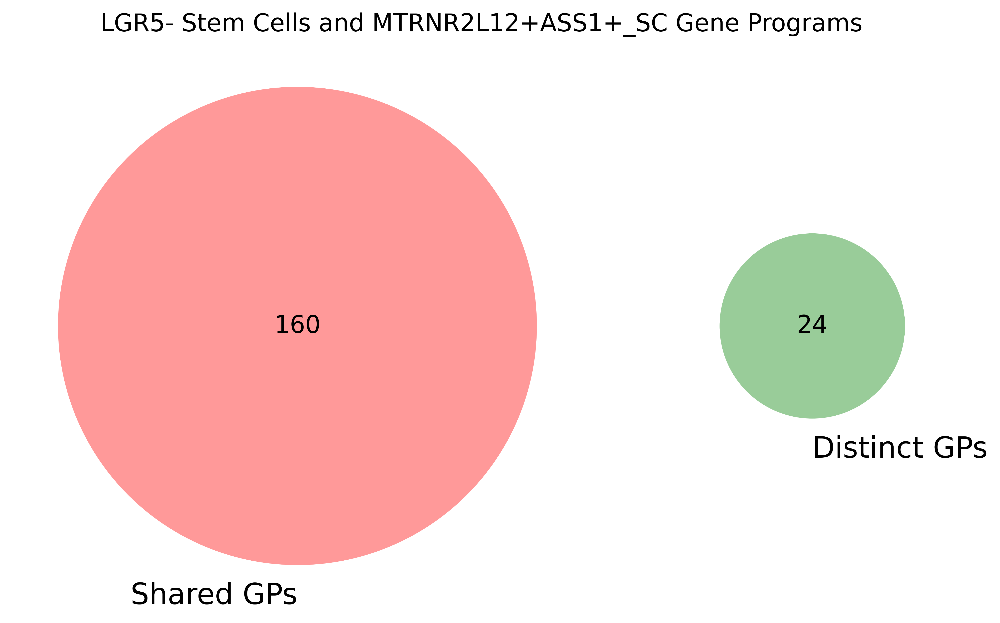

In [96]:
plt.figure(figsize=(10, 6), dpi = 300)
venn2([shared_programs, distinct_programs], 
      set_labels=('Shared GPs', 'Distinct GPs'),)
plt.title('LGR5- Stem Cells and MTRNR2L12+ASS1+_SC Gene Programs')

#### RPS10+_RPS17+_SC

In [58]:
human_adata = human_adata_copy.copy()

In [59]:
human_adata = human_adata[human_adata.obs['cell_type']=='RPS10+_RPS17+_SC'].copy()

In [60]:
human_adata = human_adata[:, mouse_adata.var_names]

+ Add terms to query dataset

In [61]:
human_adata.uns['terms'] = mouse_adata.uns['terms']

+ Train the model

In [62]:
q_intr_cvae = sca.models.EXPIMAP.load_query_data(human_adata, intr_cvae,
                                                 unfreeze_ext=True,
                                                 use_hsic=True,
                                                 hsic_one_vs_all=True
                                                )

AnnData object with n_obs × n_vars = 3544 × 1521
    obs: 'Sample_ID', 'Cell Type', 'Study_name', 'Donor_ID', 'Diagnosis', 'Age', 'Region code', 'Fraction', 'Sex', 'Library_Preparation_Protocol', 'batch', 'Age_group', 'Location', 'Cell States', 'Cell States GCA', 'Chem', 'Layer', 'Cell States Kong', 'dataset', 'n_genes_by_counts', 'total_counts', 'total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'pct_counts_ribo', 'Cell_ID', '_scvi_batch', '_scvi_labels', 'n_genes', 'n_counts', 'leiden', 'cluster', 'cell_type'
    var: 'feature_types-0-0-0', 'gene_name-1-0-0', 'gene_id-0-0', 'GENE-1-0', 'n_counts', 'n_cells'
    uns: 'Age_colors', 'Age_group_colors', 'Donor_ID_colors', 'Library_Preparation_Protocol_colors', 'Sex_colors', '_scvi_manager_uuid', '_scvi_uuid', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'rank_genes_groups', 'umap', 'terms'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    obsp: 'connectivities', 'distances'

INITI

In [63]:
q_intr_cvae.train(n_epochs = 400, 
                  alpha_epoch_anneal = 100, 
                  weight_decay = 0.,
                  alpha_kl = 0.1, 
                  seed = 1712, 
                  alpha_l1=0.96,
                  gamma_ext=0.7,
                  gamma_epoch_anneal=50, 
                  beta=3.,
                  use_early_stopping = True,
                  accelerator = "gpu",
                  devices = [0])

Preparing (3544, 1521)
Instantiating dataset
 |██████████████------| 74.5%  - val_loss: 799.6552530924 - val_recon_loss: 768.4698282878 - val_kl_loss: 311.85429890955
ADJUSTED LR
 |██████████████████--| 90.5%  - val_loss: 799.7162882487 - val_recon_loss: 768.6073608398 - val_kl_loss: 311.0893249512
ADJUSTED LR
 |██████████████████--| 92.2%  - val_loss: 798.9061482747 - val_recon_loss: 767.7902832031 - val_kl_loss: 311.1587015788
Stopping early: no improvement of more than 0 nats in 20 epochs
If the early stopping criterion is too strong, please instantiate it with different parameters in the train method.
Saving best state of network...
Best State was in Epoch 347


### Get latent representation of reference + query dataset

In [64]:
adata_joined = sc.AnnData.concatenate(mouse_adata, human_adata, batch_key = 'batch_join', uns_merge = 'same', index_unique = None)
adata_joined

AnnData object with n_obs × n_vars = 3612 × 1521
    obs: 'barcode', 'Gene_marker', 'Donor_ID', 'GFP_intensity', 'full_cell_description', 'cell_type', 'Sample', 'n_genes', 'n_counts', 'Library_Preparation_Protocol', 'Sample_ID', 'Study_name', 'Cell Type', 'Diagnosis', 'Age', 'Region code', 'Fraction', 'Sex', 'batch', 'Age_group', 'Location', 'Cell States', 'Cell States GCA', 'Chem', 'Layer', 'Cell States Kong', 'dataset', 'n_genes_by_counts', 'total_counts', 'total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'pct_counts_ribo', 'Cell_ID', '_scvi_batch', '_scvi_labels', 'leiden', 'cluster', 'batch_join'
    var: 'ensemble_gene_id_version-0', 'ensemble_gene_id-0', 'start_position-0', 'end_position-0', 'chromosome_name-0', 'external_gene_name-0', 'n_counts-0', 'n_cells-0', 'gene_name-0', 'Macrogene-0', 'Top Human Gene-0', 'Top Mouse Gene-0', 'n_counts-1', 'n_cells-1', 'feature_types-0-0-0-1', 'gene_name-1-0-0-1', 'gene_id-0-0-1', 'GENE-1-0-1'
    uns: 'terms'

+ Get latent representation for the concatenated dataset

In [65]:
adata_joined.obsm['X_cvae'] = q_intr_cvae.get_latent(adata_joined.X, 
                                                adata_joined.obs['cell_type'], 
                                                mean = MEAN, 
                                                only_active = True)

+ Visualize latent representation on the UMAP

In [66]:
if 'neighbors' in adata_joined.uns:
    del adata_joined.uns['neighbors']
sc.pp.neighbors(adata_joined, n_neighbors=20, metric='minkowski', use_rep='X_cvae')
sc.tl.umap(adata_joined, min_dist = 0.5, spread = 6, random_state = 1712)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)


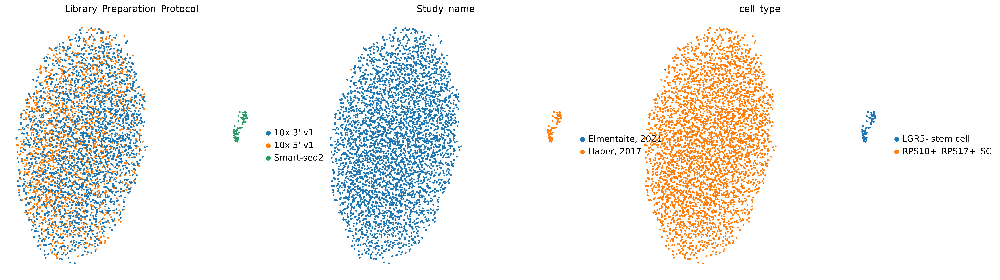

In [67]:
sc.pl.umap(adata_joined, color=['Library_Preparation_Protocol', 'Study_name', 'cell_type'], frameon=False)

+ Extract meaningful latent directions

In [68]:
q_intr_cvae.latent_directions(adata=adata_joined)

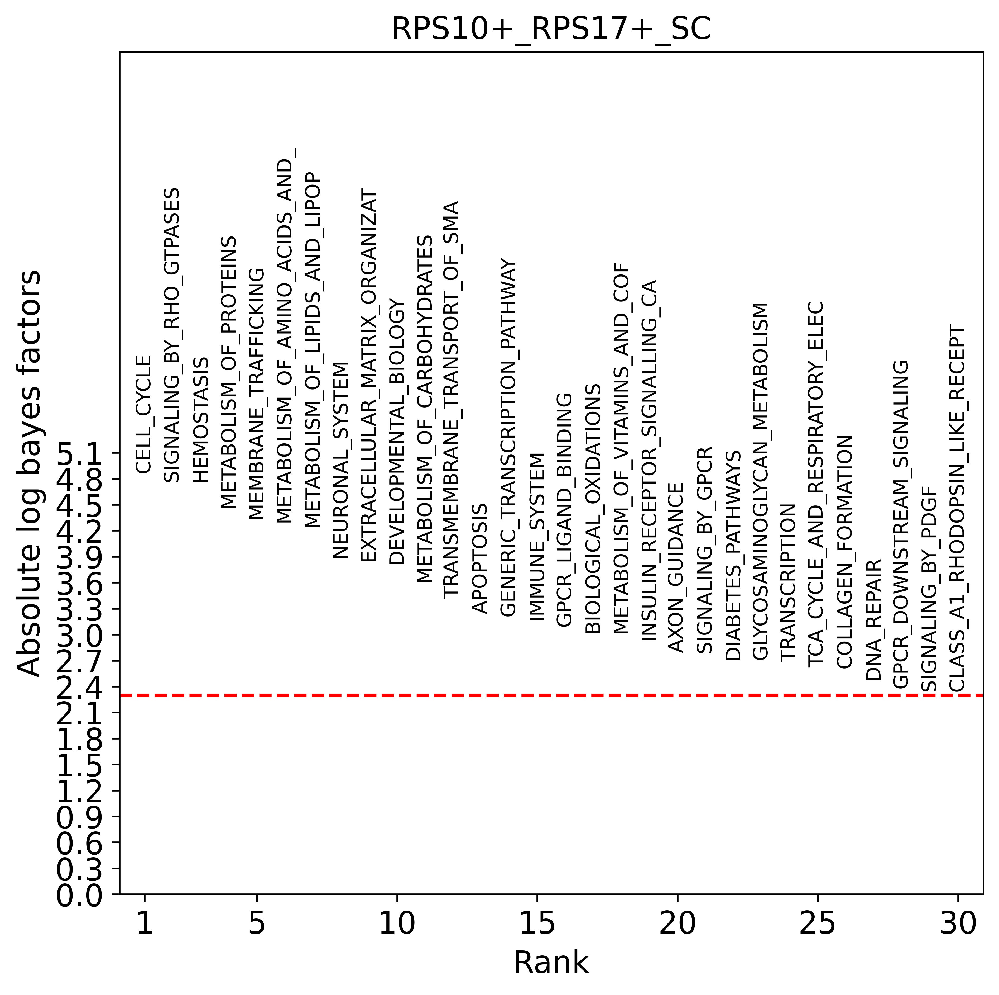

In [69]:
sc.set_figure_params(dpi=300, figsize=(7, 7))
q_intr_cvae.latent_enrich(groups = 'cell_type', comparison = 'LGR5- stem cell', adata = adata_joined, use_directions = True)
fig = sca.plotting.plot_abs_bfs(adata_joined, yt_step = 0.3, scale_y = 2, fontsize = 9)

+ Extract gene programs and absolute log bayes factors in the dataframe 

In [70]:
scores = adata_joined.uns['bf_scores']
terms = adata_joined.uns['terms']

all_programs = []

for key in scores.keys():
    bfs = np.abs(scores[key]['bf'])
    for bf, term in zip(bfs, terms):
        all_programs.append({
            'Comparison': key,
            'Gene Program': term,
            'Absolute Log Bayes Factor': bf
        })

df_gene_programs = pd.DataFrame(all_programs)
df_gene_programs = df_gene_programs.sort_values('Absolute Log Bayes Factor', ascending=False)

In [71]:
print(df_gene_programs.head())

           Comparison              Gene Program  Absolute Log Bayes Factor
19   RPS10+_RPS17+_SC                CELL_CYCLE                   4.864593
5    RPS10+_RPS17+_SC  SIGNALING_BY_RHO_GTPASES                   4.766281
166  RPS10+_RPS17+_SC                HEMOSTASIS                   4.765918
85   RPS10+_RPS17+_SC    METABOLISM_OF_PROTEINS                   4.465494
15   RPS10+_RPS17+_SC      MEMBRANE_TRAFFICKING                   4.338860


In [72]:
df_gene_programs.to_csv('data/expimap_results/LGR5low_vs_RPS10+_RPS17+_SC.csv', index=False)

+ Create Venn diagram

In [97]:
df_gene_programs = pd.read_csv('data/expimap_results/LGR5low_vs_RPS10+_RPS17+_SC.csv')

In [98]:
df_filtered = df_gene_programs[df_gene_programs['Absolute Log Bayes Factor'] != 0]

In [99]:
removed_count = len(df_gene_programs) - len(df_filtered)
print(f"Number of gene programs removed (Absolute Log Bayes Factor = 0): {removed_count}")

Number of gene programs removed (Absolute Log Bayes Factor = 0): 18


In [101]:
shared_programs = set(df_filtered[df_filtered['Absolute Log Bayes Factor'] < 2.4]['Gene Program'])
distinct_programs = set(df_filtered[df_filtered['Absolute Log Bayes Factor'] >= 2.4]['Gene Program'])

Text(0.5, 1.0, 'LGR5- Stem Cells and RPS10+_RPS17+_SC Gene Programs')

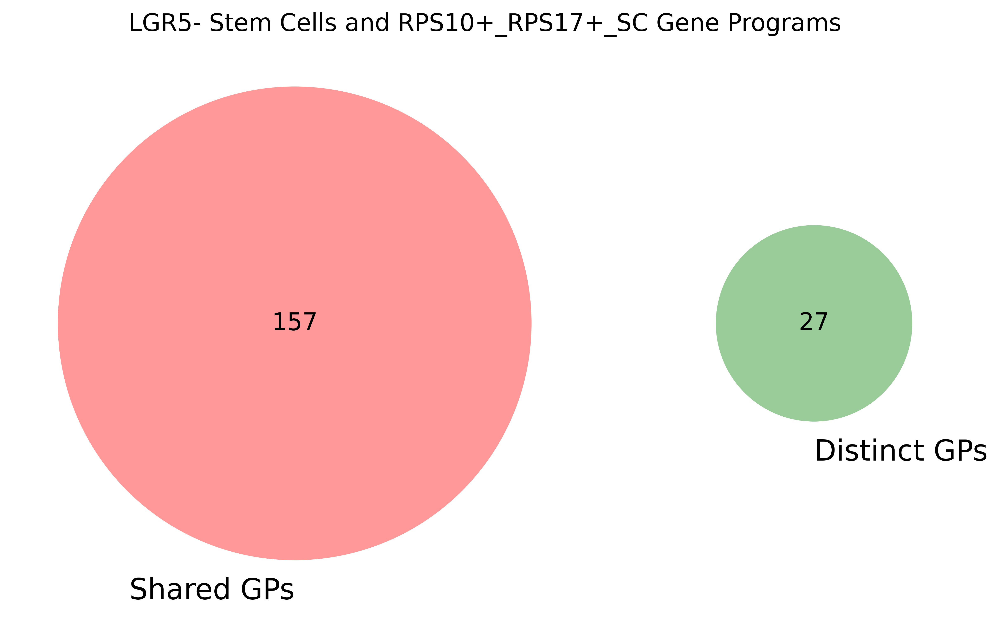

In [102]:
plt.figure(figsize=(10, 6), dpi = 300)
venn2([shared_programs, distinct_programs], 
      set_labels=('Shared GPs', 'Distinct GPs'),)
plt.title('LGR5- Stem Cells and RPS10+_RPS17+_SC Gene Programs') 

#### FXYD3+_CKB+_SC

In [75]:
human_adata = human_adata_copy.copy()

In [76]:
human_adata = human_adata[human_adata.obs['cell_type']=='FXYD3+_CKB+_SC'].copy()

In [77]:
human_adata = human_adata[:, mouse_adata.var_names]

+ Add terms to query dataset

In [78]:
human_adata.uns['terms'] = mouse_adata.uns['terms']

+ Train the model

In [79]:
q_intr_cvae = sca.models.EXPIMAP.load_query_data(human_adata, intr_cvae,
                                                 unfreeze_ext=True,
                                                 use_hsic=True,
                                                 hsic_one_vs_all=True
                                                )

AnnData object with n_obs × n_vars = 294 × 1521
    obs: 'Sample_ID', 'Cell Type', 'Study_name', 'Donor_ID', 'Diagnosis', 'Age', 'Region code', 'Fraction', 'Sex', 'Library_Preparation_Protocol', 'batch', 'Age_group', 'Location', 'Cell States', 'Cell States GCA', 'Chem', 'Layer', 'Cell States Kong', 'dataset', 'n_genes_by_counts', 'total_counts', 'total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'pct_counts_ribo', 'Cell_ID', '_scvi_batch', '_scvi_labels', 'n_genes', 'n_counts', 'leiden', 'cluster', 'cell_type'
    var: 'feature_types-0-0-0', 'gene_name-1-0-0', 'gene_id-0-0', 'GENE-1-0', 'n_counts', 'n_cells'
    uns: 'Age_colors', 'Age_group_colors', 'Donor_ID_colors', 'Library_Preparation_Protocol_colors', 'Sex_colors', '_scvi_manager_uuid', '_scvi_uuid', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'rank_genes_groups', 'umap', 'terms'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    obsp: 'connectivities', 'distances'

INITIA

In [80]:
q_intr_cvae.train(n_epochs = 400, 
                  alpha_epoch_anneal = 100, 
                  weight_decay = 0.,
                  alpha_kl = 0.1, 
                  seed = 1712, 
                  alpha_l1=0.96,
                  gamma_ext=0.7,
                  gamma_epoch_anneal=50, 
                  beta=3.,
                  use_early_stopping = True,
                  accelerator = "gpu",
                  devices = [0])

Preparing (294, 1521)
Instantiating dataset
 |████████████████████| 100.0%  - val_loss: 1025.3948974609 - val_recon_loss: 975.2988891602 - val_kl_loss: 500.9599304199
Saving best state of network...
Best State was in Epoch 398


### Get latent representation of reference + query dataset

In [81]:
adata_joined = sc.AnnData.concatenate(mouse_adata, human_adata, batch_key = 'batch_join', uns_merge = 'same', index_unique = None)
adata_joined

AnnData object with n_obs × n_vars = 362 × 1521
    obs: 'barcode', 'Gene_marker', 'Donor_ID', 'GFP_intensity', 'full_cell_description', 'cell_type', 'Sample', 'n_genes', 'n_counts', 'Library_Preparation_Protocol', 'Sample_ID', 'Study_name', 'Cell Type', 'Diagnosis', 'Age', 'Region code', 'Fraction', 'Sex', 'batch', 'Age_group', 'Location', 'Cell States', 'Cell States GCA', 'Chem', 'Layer', 'Cell States Kong', 'dataset', 'n_genes_by_counts', 'total_counts', 'total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'pct_counts_ribo', 'Cell_ID', '_scvi_batch', '_scvi_labels', 'leiden', 'cluster', 'batch_join'
    var: 'ensemble_gene_id_version-0', 'ensemble_gene_id-0', 'start_position-0', 'end_position-0', 'chromosome_name-0', 'external_gene_name-0', 'n_counts-0', 'n_cells-0', 'gene_name-0', 'Macrogene-0', 'Top Human Gene-0', 'Top Mouse Gene-0', 'n_counts-1', 'n_cells-1', 'feature_types-0-0-0-1', 'gene_name-1-0-0-1', 'gene_id-0-0-1', 'GENE-1-0-1'
    uns: 'terms'

+ Get latent representation for the concatenated dataset

In [82]:
adata_joined.obsm['X_cvae'] = q_intr_cvae.get_latent(adata_joined.X, 
                                                adata_joined.obs['cell_type'], 
                                                mean = MEAN, 
                                                only_active = True)

+ Visualize latent representation on the UMAP

In [83]:
if 'neighbors' in adata_joined.uns:
    del adata_joined.uns['neighbors']
sc.pp.neighbors(adata_joined, n_neighbors=20, metric='minkowski', use_rep='X_cvae')
sc.tl.umap(adata_joined, min_dist = 0.5, spread = 6, random_state = 1712)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


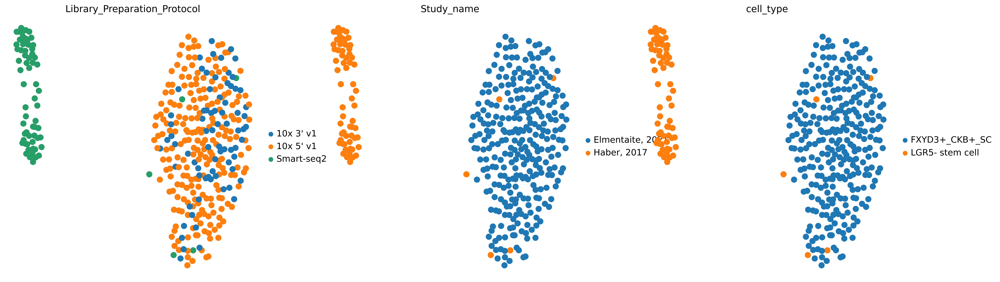

In [84]:
sc.set_figure_params(dpi=300, figsize=(7, 7))
sc.pl.umap(adata_joined, color=['Library_Preparation_Protocol', 'Study_name', 'cell_type'], frameon=False)

+ Extract meaningful latent directions

In [85]:
q_intr_cvae.latent_directions(adata=adata_joined)

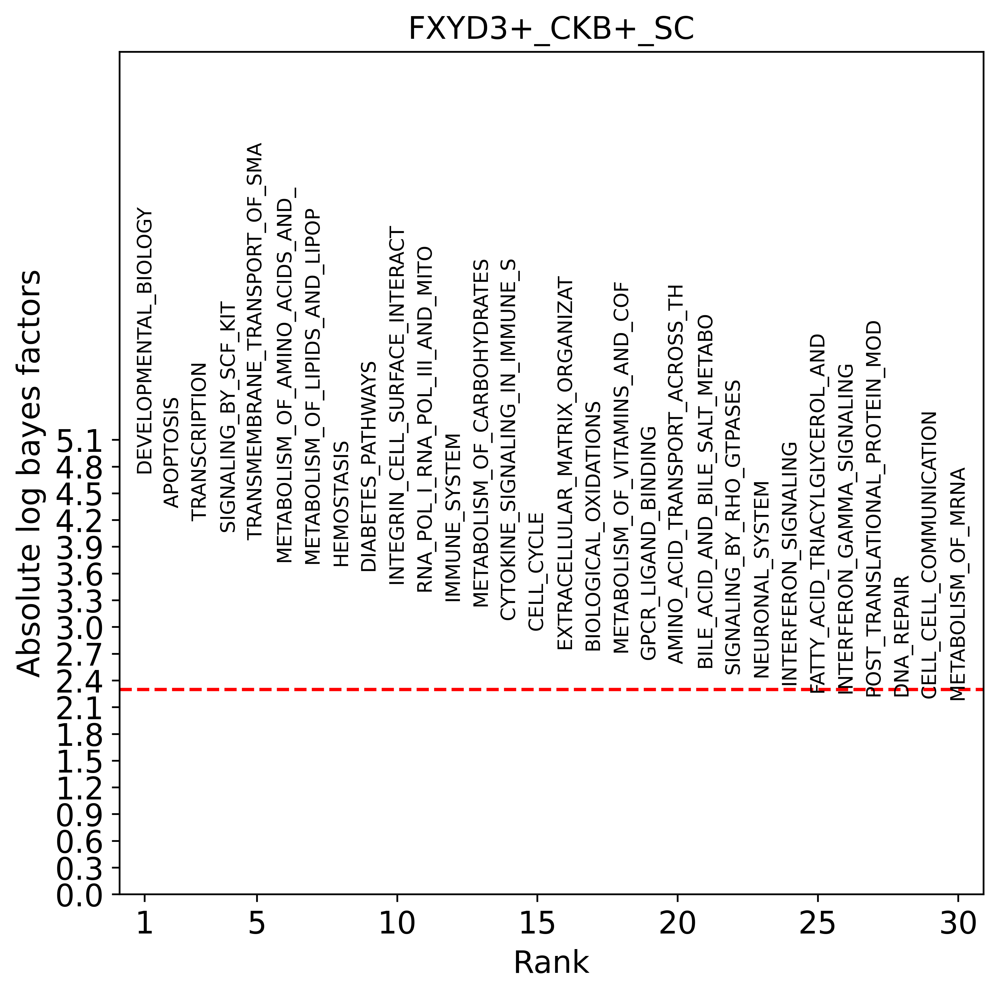

In [86]:
sc.set_figure_params(dpi=300, figsize=(7, 7))
q_intr_cvae.latent_enrich(groups = 'cell_type', comparison = 'LGR5- stem cell', adata = adata_joined, use_directions = True)
fig = sca.plotting.plot_abs_bfs(adata_joined, yt_step = 0.3, scale_y = 2, fontsize = 9)

+ Extract gene programs and absolute log bayes factors in the dataframe 

In [87]:
scores = adata_joined.uns['bf_scores']
terms = adata_joined.uns['terms']

all_programs = []

for key in scores.keys():
    bfs = np.abs(scores[key]['bf'])
    for bf, term in zip(bfs, terms):
        all_programs.append({
            'Comparison': key,
            'Gene Program': term,
            'Absolute Log Bayes Factor': bf
        })

df_gene_programs = pd.DataFrame(all_programs)
df_gene_programs = df_gene_programs.sort_values('Absolute Log Bayes Factor', ascending=False)

In [88]:
print(df_gene_programs.head())

         Comparison                    Gene Program  Absolute Log Bayes Factor
8    FXYD3+_CKB+_SC           DEVELOPMENTAL_BIOLOGY                   4.726542
164  FXYD3+_CKB+_SC                       APOPTOSIS                   4.335529
92   FXYD3+_CKB+_SC                   TRANSCRIPTION                   4.186424
7    FXYD3+_CKB+_SC            SIGNALING_BY_SCF_KIT                   4.069276
78   FXYD3+_CKB+_SC  TRANSMEMBRANE_TRANSPORT_OF_SMA                   3.973179


In [89]:
df_gene_programs.to_csv('data/expimap_results/LGR5low_vs_FXYD3+_CKB+_SC.csv', index=False)

+ Create Venn diagram

In [103]:
df_gene_programs = pd.read_csv('data/expimap_results/LGR5low_vs_FXYD3+_CKB+_SC.csv')

In [104]:
df_filtered = df_gene_programs[df_gene_programs['Absolute Log Bayes Factor'] != 0]

In [105]:
removed_count = len(df_gene_programs) - len(df_filtered)
print(f"Number of gene programs removed (Absolute Log Bayes Factor = 0): {removed_count}")

Number of gene programs removed (Absolute Log Bayes Factor = 0): 18


In [107]:
shared_programs = set(df_filtered[df_filtered['Absolute Log Bayes Factor'] < 2.4]['Gene Program'])
distinct_programs = set(df_filtered[df_filtered['Absolute Log Bayes Factor'] >= 2.4]['Gene Program'])

Text(0.5, 1.0, 'LGR5+ Stem Cells and FXYD3+_CKB+_SC Gene Programs')

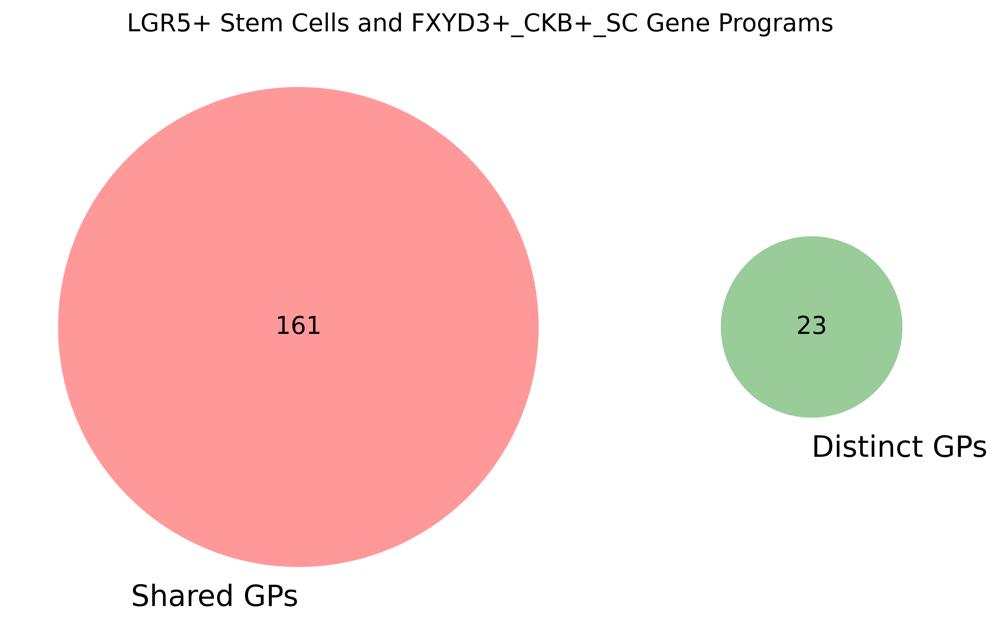

In [108]:
plt.figure(figsize=(10, 6), dpi = 300)
venn2([shared_programs, distinct_programs], 
      set_labels=('Shared GPs', 'Distinct GPs'),)
plt.title('LGR5+ Stem Cells and FXYD3+_CKB+_SC Gene Programs')